In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import anndata
import scipy

import os

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.simplefilter("ignore", UserWarning)

from tqdm import tqdm

In [2]:
import session_info
session_info.show()

In [3]:
sc.settings.set_figure_params(dpi=120)

In [4]:
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("module.name", "/rfs/project/rfs-iCNyzSAaucw/kk837/function/python/utils.py")
utils = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = utils
spec.loader.exec_module(utils)

# Variables

In [5]:
data_object_dir = '/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/VisiumHD/Revision_Oct2025'

In [6]:
!ls -lh {data_object_dir}

total 7.2G
-rwxrwx---+ 1 kk837 kk837 4.8G Nov 17 21:43 all_b2c_cells_filtered_raw.h5ad
-rwxrwx---+ 1 kk837 kk837 4.8G Nov 17 21:39 all_b2c_cells_raw.h5ad
drwxrwx---+ 6 kk837 kk837  277 Nov 17 21:25 archive_17Nov2025
drwxrwx---+ 4 kk837 kk837   58 Nov 17 22:37 scVI


# Read in original adata

In [7]:
%%time
adata = sc.read_h5ad(f'{data_object_dir}/all_b2c_cells_filtered_raw.h5ad')
adata

CPU times: user 409 ms, sys: 1.75 s, total: 2.16 s
Wall time: 44.9 s


AnnData object with n_obs × n_vars = 225097 × 18085
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'in_tissue_manual', 'library', 'donor_section_ID', 'per-frame_donorIDs', 'donor', 'CS', 'est_CS', 'GA', 'PCW', 'section_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_donor', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

# Add scVI latent space

In [8]:
filename_header = 'correcting-donor_'
latent_file_name_list = os.listdir(f'{data_object_dir}/scVI/latent_variables')
latent_file_name_list = [x.split('.h5ad')[0] for x in latent_file_name_list if (x!='archive')&(filename_header in x)]
latent_file_name_list

['correcting-donor_n-layers-3',
 'correcting-donor_n-layers-1',
 'correcting-donor_n-layers-2']

In [9]:
for latent_file_name in latent_file_name_list:
    latent_space_condition = latent_file_name.split(filename_header)[1]
    latent = sc.read_h5ad(f'{data_object_dir}/scVI/latent_variables/{latent_file_name}.h5ad')
    # add latent space
    adata.obsm[f'scVI_latent_{latent_space_condition}']=latent.X.copy()

In [10]:
adata

AnnData object with n_obs × n_vars = 225097 × 18085
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'in_tissue_manual', 'library', 'donor_section_ID', 'per-frame_donorIDs', 'donor', 'CS', 'est_CS', 'GA', 'PCW', 'section_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_donor', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer', 'scVI_latent_n-layers-3', 'scVI_latent_n-layers-1', 'scVI_latent_n-layers-2'

# Find neighbors, UMAP

In [11]:
latent_file_name_list.sort()
latent_file_name_list

['correcting-donor_n-layers-1',
 'correcting-donor_n-layers-2',
 'correcting-donor_n-layers-3']

##### n-layers-1 #####


/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


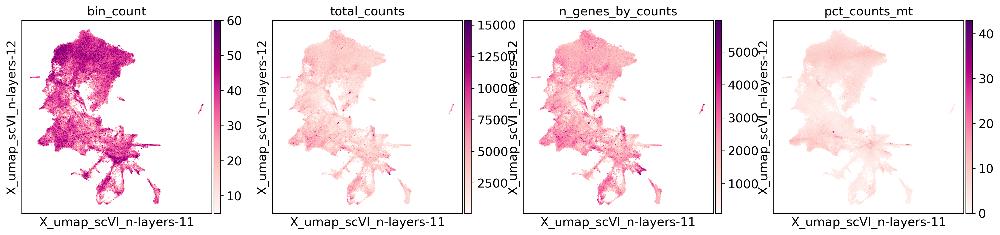

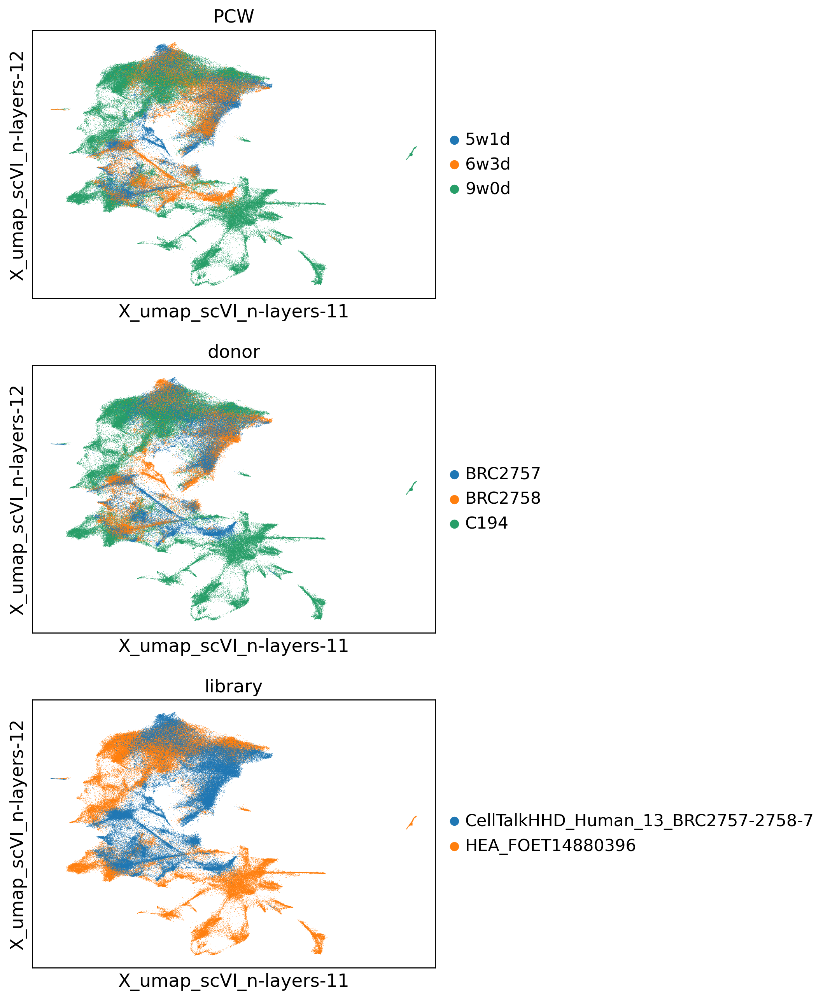



##### n-layers-2 #####


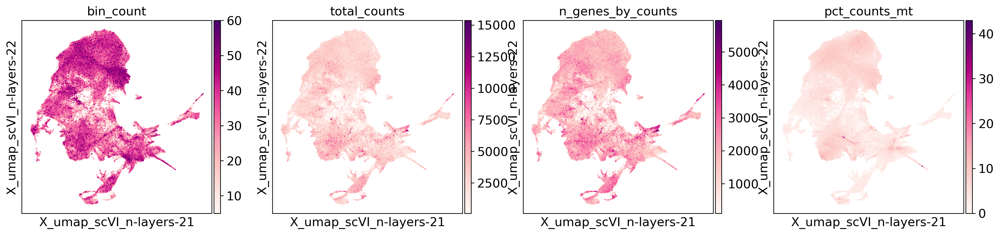

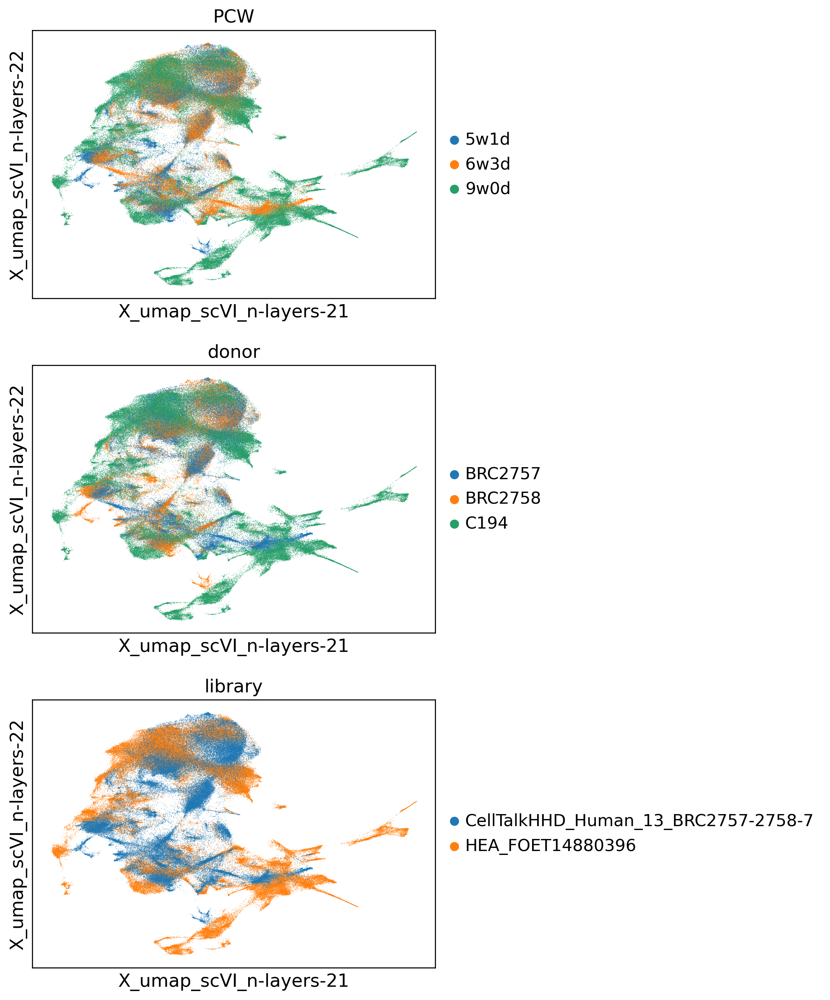



##### n-layers-3 #####


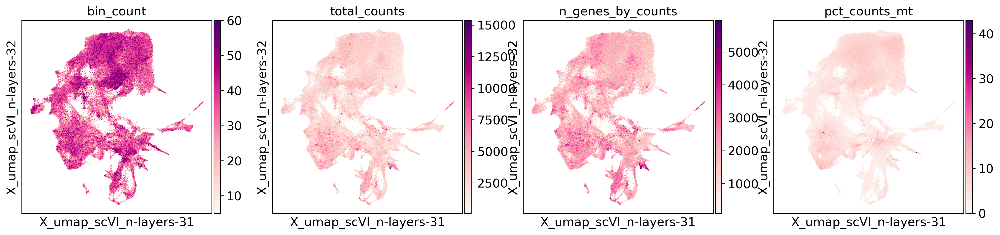

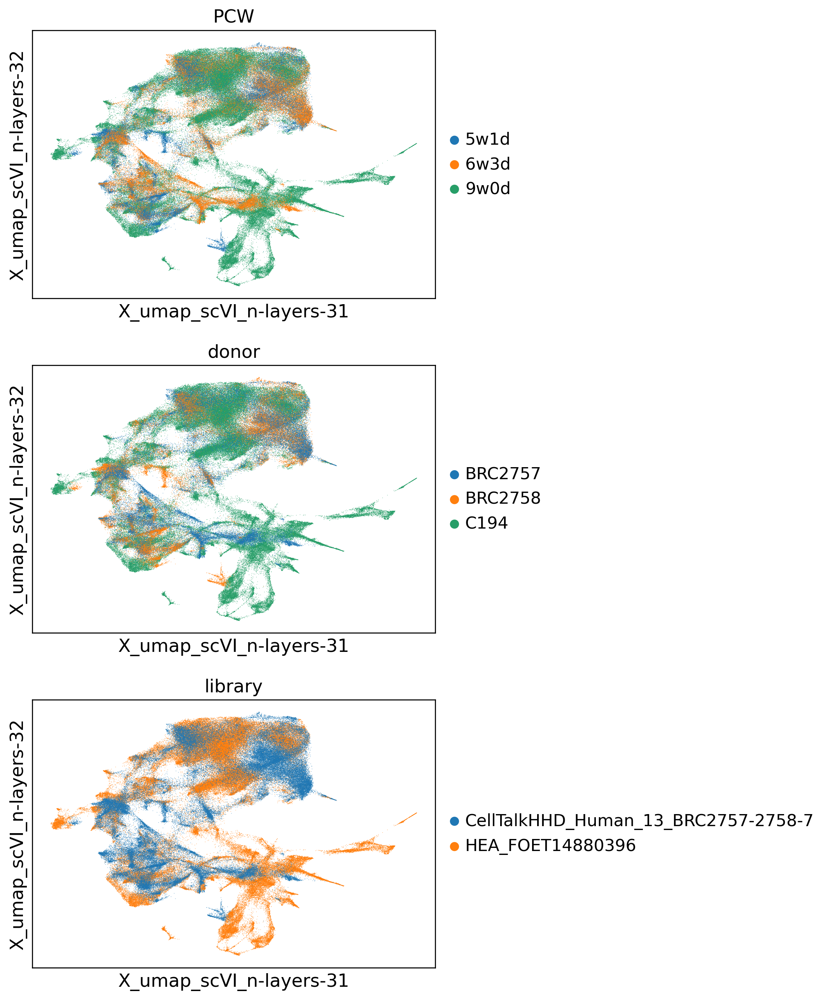



CPU times: user 17min 3s, sys: 1.74 s, total: 17min 5s
Wall time: 12min 24s


In [12]:
%%time
for latent_file_name in latent_file_name_list:
    latent_space_condition = latent_file_name.split(filename_header)[1]
    print(f'##### {latent_space_condition} #####')
    sc.pp.neighbors(adata, use_rep=f'scVI_latent_{latent_space_condition}',n_neighbors=15)
    sc.tl.umap(adata, min_dist=0.2, spread=1.0)# 
    adata.obsm[f'X_umap_scVI_{latent_space_condition}'] = adata.obsm['X_umap'].copy()
    del adata.obsm['X_umap']
    # check batches
    sc.pl.embedding(adata, basis=f'X_umap_scVI_{latent_space_condition}',
                color=['bin_count','total_counts','n_genes_by_counts',"pct_counts_mt"], 
           size=5, wspace=0.2, ncols=6, components='all',cmap='RdPu')

    sc.pl.embedding(adata,basis=f'X_umap_scVI_{latent_space_condition}',
                    color=['PCW','donor','library'],wspace=0.5,
                    ncols=1
                   )
    print('')
    print('')

# Save

In [13]:
%%time
adata.write(f'{data_object_dir}/all_b2c_cells_filtered_raw.h5ad')
adata

CPU times: user 469 ms, sys: 2.62 s, total: 3.09 s
Wall time: 49.3 s


AnnData object with n_obs × n_vars = 225097 × 18085
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'in_tissue_manual', 'library', 'donor_section_ID', 'per-frame_donorIDs', 'donor', 'CS', 'est_CS', 'GA', 'PCW', 'section_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_donor', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial', 'neighbors', 'umap', 'PCW_colors', 'donor_colors', 'library_colors'
    obsm: 'spatial', 'spatial_cropped_150_buffer', 'scVI_latent_n-layers-3', 'scVI_latent_n-layers-1', 'scVI_latent_n-layers-2', 'X_umap_scVI_n-layers-1', 'X_umap_scVI_n-layers-2', 

In [14]:
adata.X.data[:5]

array([1., 1., 1., 1., 1.], dtype=float32)